In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread
import seaborn as sns
import fonctions as fc
import importlib
import time

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn import cluster, metrics

import os
from os import listdir
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, adjusted_rand_score, confusion_matrix, classification_report

import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalAveragePooling1D, Flatten, Dense, Dropout 
from tensorflow.keras.layers import Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

import cv2
from PIL import Image, ImageOps, ImageFilter
from IPython.display import Image, display

D:\Programme\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Anais\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Anais\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\Anais\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Anais\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Anais\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]

In [2]:
importlib.reload(fc)

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Anais\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Anais\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\Anais\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Anais\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Anais\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Anais\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


<module 'fonctions' from 'C:\\Users\\Anais\\Documents\\OpenClassRooms\\Projet6+Classifiez+automatiquement+des+biens+de+consommation\\Dataset+projet+prétraitement+textes+images\\Flipkart\\fonctions.py'>

# Enoncé

Vous êtes Data Scientist au sein de l’entreprise "Place de marché”, qui souhaite lancer une marketplace e-commerce.

Sur cette place de marché anglophone, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.
 
Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc peu fiable. De plus, le volume des articles est pour l’instant très pe

Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle,  il devient nécessaire d'automatiser cette tâche d‘attribution de la catrie.

Linda, Lead Data Scientist, vous demande donc d'étudier la faisabilité d'un moteur de classification des articles en différentes catégories, à partir du texte (en anglais) et de l’image comme dans l’illustration

# Missions

La mission sera de réaliser une étude de faisabilité d'un moteur de classification automatique d’articles, en utilisant leur image et leur description ci-dessous.

Dans ce notebook, nous nous concentrerons sur la réalisation de la faisabilité à partir d'images. 


## I- Visualisation des données

In [3]:
df = pd.read_csv("flipkart_com-ecommerce_sample_1050.csv")
df.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [4]:
print('Ce jeu de donnée comporte ' + str(df.shape[0]) + ' lignes et ' + str(df.shape[1]) + ' colonnes')

Ce jeu de donnée comporte 1050 lignes et 15 colonnes


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

## II- Nettoyage des données

La mission est de réaliser une étude de la faisabilité d'un moteur de classification automatique d'articles, en utilisant leur image et leur description. Nous utiliserons donc uniquement les colonnes description et image, à savoir 'product_category_tree' et 'image'

In [6]:
df = df.drop(["uniq_id", "crawl_timestamp", "product_url", "product_name","pid", "retail_price", "discounted_price", "description", "is_FK_Advantage_product", "product_rating", "overall_rating", "brand", "product_specifications"], axis=1)
df.head()

,product_category_tree,image
0,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg
2,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg
3,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg
4,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg


#### _Nouvelle variable 'main_category'_

On effectue le même nettoyage de la variable 'product_category_tree' que sur le premier notebook, afin de la créer la variable 'main_category'

In [7]:
# Elimination des crochets et des guillemets de la variable 'product_category_tree'
df["product_category_tree"] = df["product_category_tree"].str.replace("[", "")
df["product_category_tree"] = df["product_category_tree"].str.replace("]", "")
df["product_category_tree"] = df["product_category_tree"].str.replace('"', '')

# Création de la variable 'main_category'
df["main_category"] = df["product_category_tree"].str.split('>>').str[0]

# Nettoyage (lower // remplacer '&' par 'and' // supprimer les espaces)
df["main_category"] = df["main_category"].str.lower()
df["main_category"] = df["main_category"].str.replace("&", 'and')
df['main_category'] = df['main_category'].str.strip()

#Elimination de la variable 'product_category_tree'
df = df.drop("product_category_tree", axis = 1)

#Visualisation du nouveau df
nb_category = df['main_category'].value_counts()
print(nb_category)

main_category
home furnishing                 150
baby care                       150
watches                         150
home decor and festive needs    150
kitchen and dining              150
beauty and personal care        150
computers                       150
Name: count, dtype: int64


#### _Dossier image_

On télécharge le dossier de 1050 images que nous allons ajouter au jeu de données

In [8]:
pathway = "C:\\Users\\Anais\\Documents\\OpenClassRooms\\Projet6+Classifiez+automatiquement+des+biens+de+consommation\\Dataset+projet+prétraitement+textes+images\\Flipkart\\Images"
list_photos = [file for file in listdir(pathway)]
print(len(list_photos))

1050


In [9]:
# Création de la variable 'path_image' comportant l'accès au fichier image
df["path_image"] = df["image"].apply(fc.image_pathway)
df.head()

,image,main_category,path_image
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,home furnishing,Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,baby care,Images/7b72c92c2f6c40268628ec5f14c6d590.jpg
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,baby care,Images/64d5d4a258243731dc7bbb1eef49ad74.jpg
3,d4684dcdc759dd9cdf41504698d737d8.jpg,home furnishing,Images/d4684dcdc759dd9cdf41504698d737d8.jpg
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,home furnishing,Images/6325b6870c54cd47be6ebfbffa620ec7.jpg


home furnishing


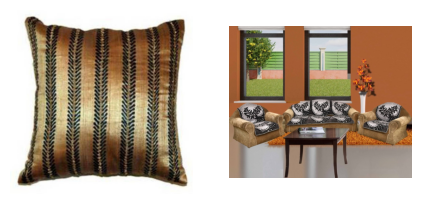

baby care


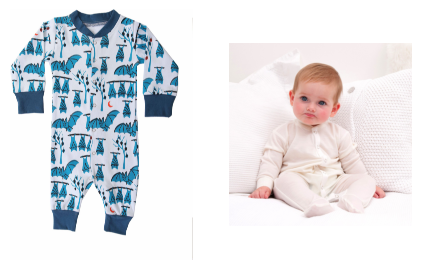

watches


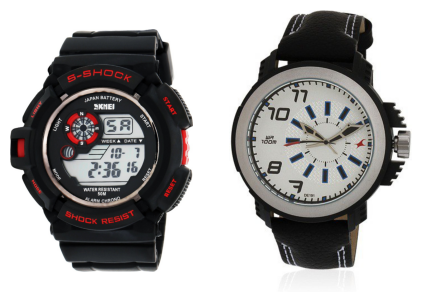

home decor and festive needs


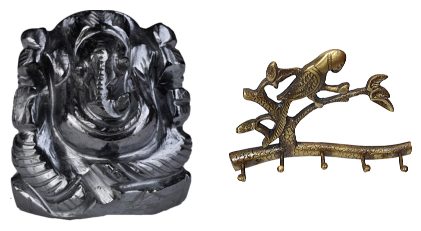

kitchen and dining


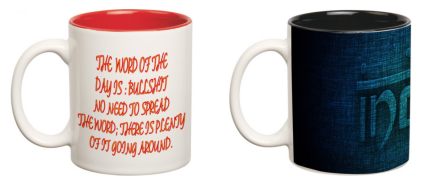

beauty and personal care


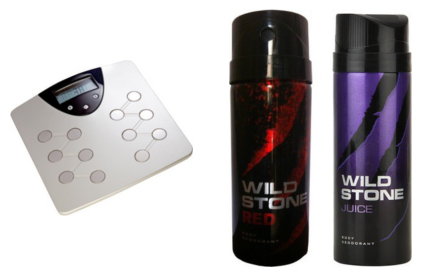

computers


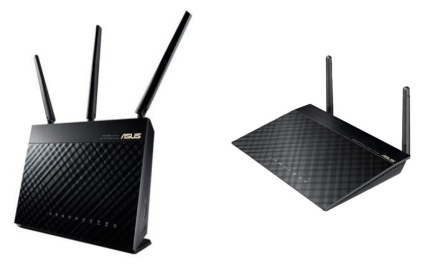

In [10]:
#Visualisation des données importées
def list_fct(name):
    return [df["path_image"][i] for i in range(len(df)) if df["main_category"][i] == name]

list_categories = ['home furnishing', 'baby care', 'watches', 'home decor and festive needs', 'kitchen and dining', 'beauty and personal care', 'computers']

for name in list_categories:
    print(name)
    # print("-------")
    list_images = list_fct(name)
    for i in range(2):
        plt.subplot(130 + 1 + i)
        filename = list_images[i + 18]
        image = imread(filename)
        plt.axis("off")
        plt.imshow(image)
    plt.show()

## III- Traitement d'image

### 3.1) Extraction d'une image de chaque catégorie

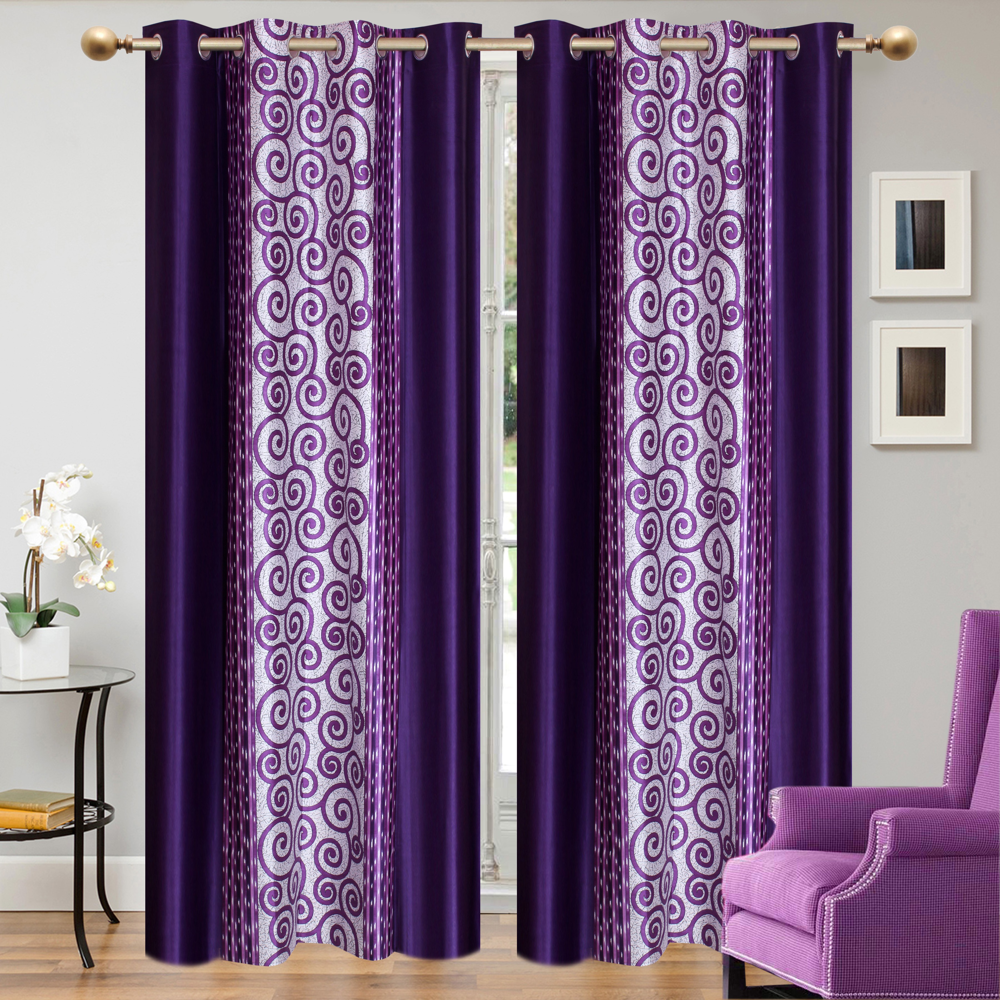

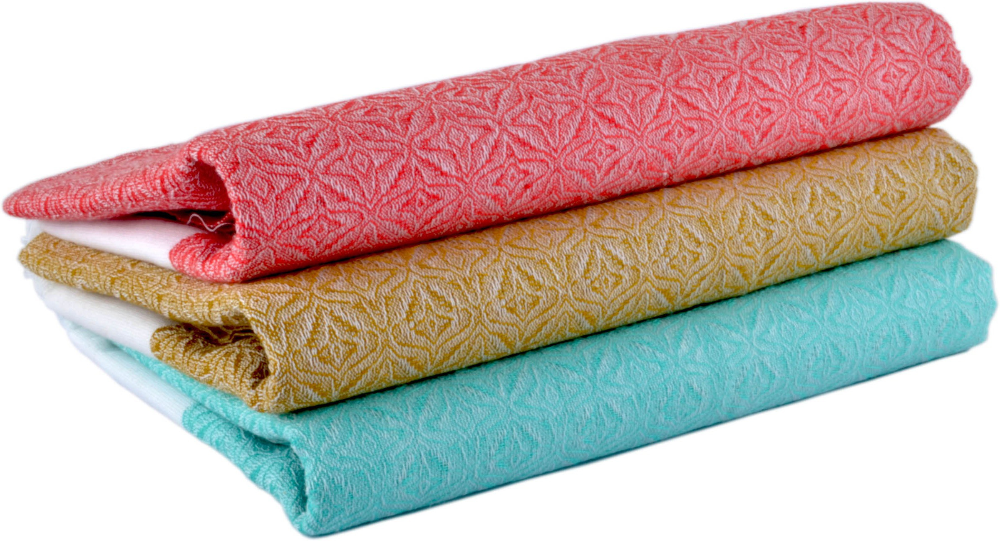

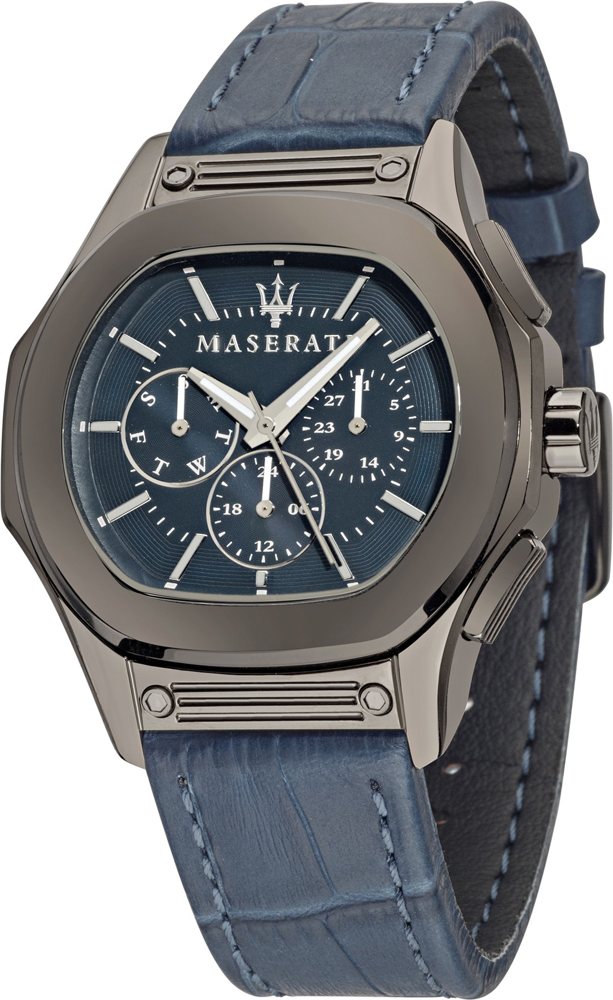

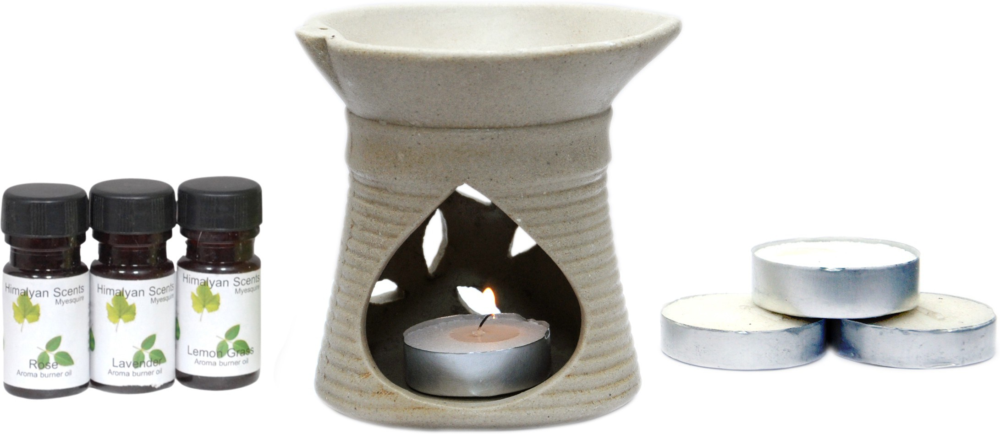

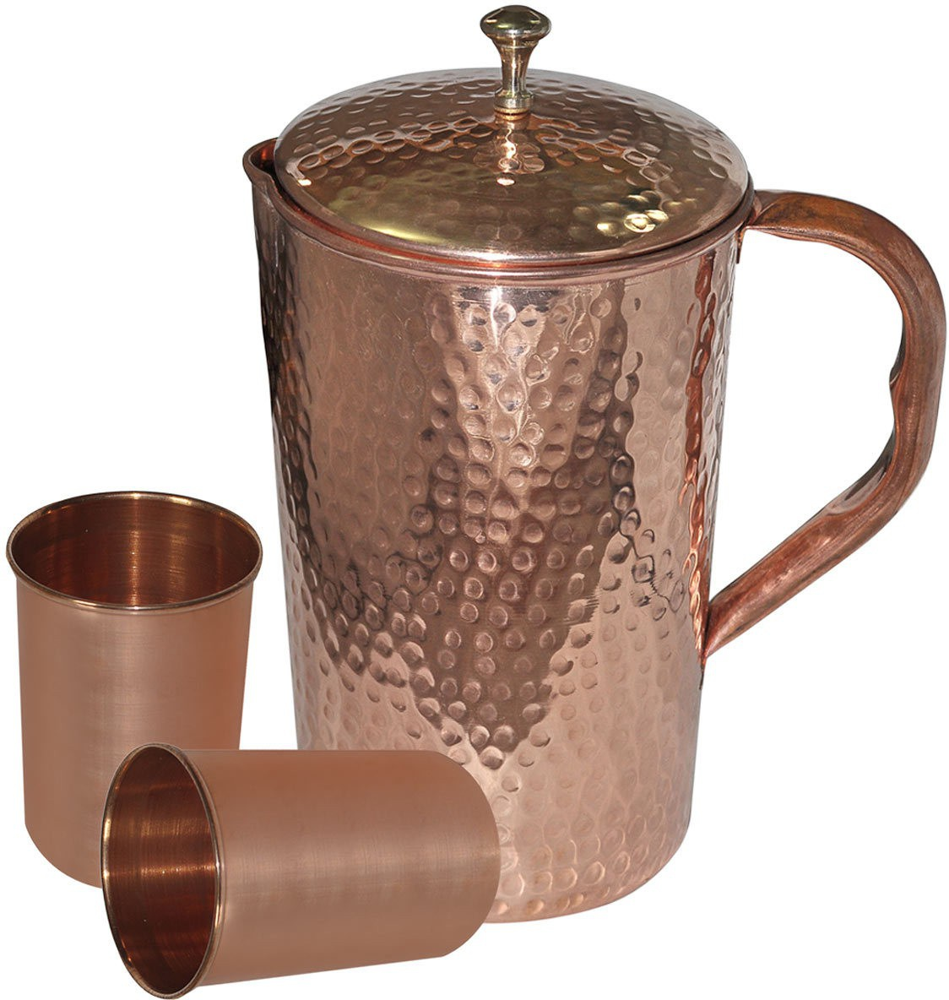

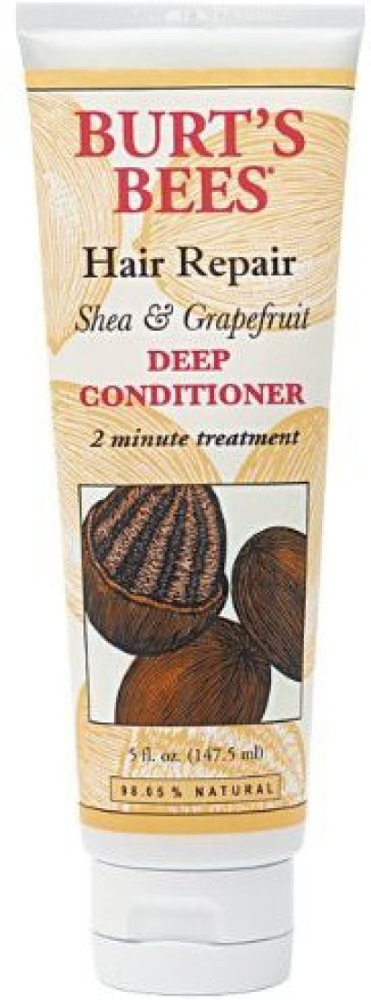

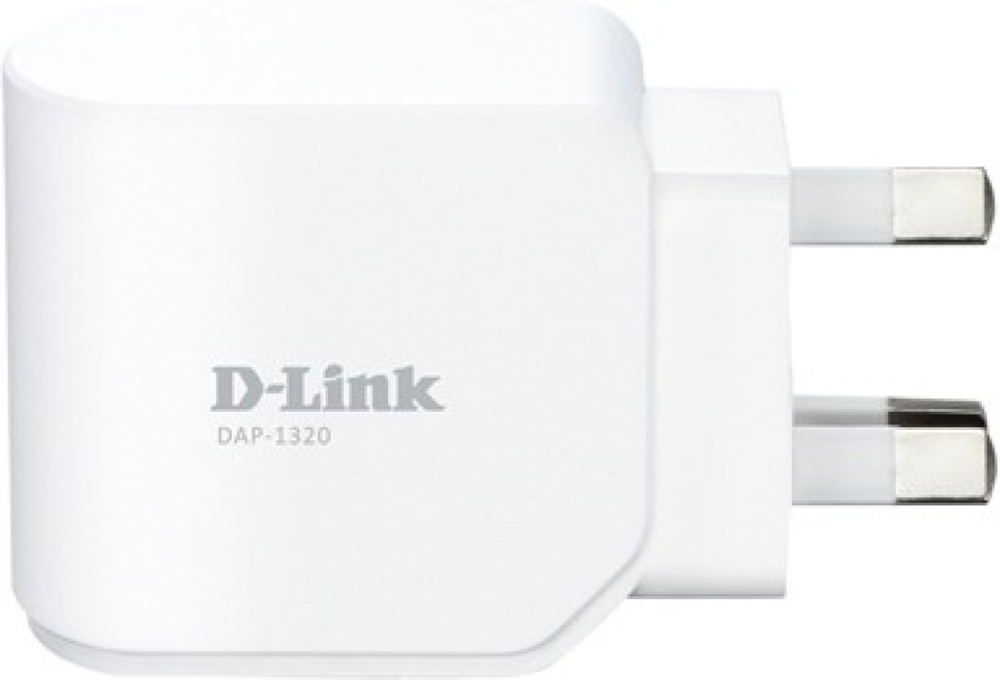

In [11]:
# Sélection de la première image de chaque catégorie
df_test = df.drop_duplicates(subset="main_category", keep='first')

from IPython.display import Image

for image_path in df_test["path_image"]:
    display(Image(filename=image_path))

### 3.2) Conversion de l'image en niveau de gris

In [12]:
from PIL import Image
# Chargement et conversion de l'image en niveau de gris
teaching_image = Image.open('Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg').convert("L")
w, h = teaching_image.size
print("Largeur : {} px, hauteur : {} px".format(w, h))

Largeur : 3600 px, hauteur : 3600 px


Une taille couramment utilisée pour réduire la dimension des images tout en conservant suffisamment d'informations est 224x224, ce qui est souvent utilisé dans les modèles de réseaux de neurones convolutionnels pré-entraînés comme VGG, ResNet, etc. Nous allons donc utiliser cette taille pour la réduction de nos images

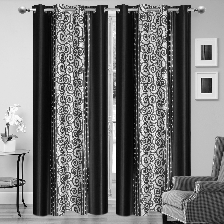

In [13]:
largeur = 224
hauteur = 224

# Affichage de l'image
display(teaching_image.resize((largeur, hauteur), Image.NEAREST))

In [14]:
# Affichage du mode de quantification de l'image
print("Format des pixels : {}".format(teaching_image.mode))

# Récupération et affichage de la valeur du pixel à une position précise
px_value = teaching_image.getpixel((20, 100))
print("Valeur du pixel à la position (20,100) : {}".format(px_value))

Format des pixels : L
Valeur du pixel à la position (20,100) : 210


In [15]:
# Récupération des valeurs de tous les pixels sous forme de matrice
teaching_mat = np.array(teaching_image)
print("Matrice de pixels :")
print(teaching_mat)

# Affichage de la taille de la matrice de pixels
print("Dimensions de la matrice de pixels : {}".format(teaching_mat.shape))

Matrice de pixels :
[[185 185 186 ... 167 167 167]
 [185 186 186 ... 167 167 167]
 [186 187 187 ... 168 167 167]
 ...
 [180 180 180 ... 105 109 114]
 [181 181 181 ... 115 118 122]
 [181 181 181 ... 124 126 129]]
Dimensions de la matrice de pixels : (3600, 3600)


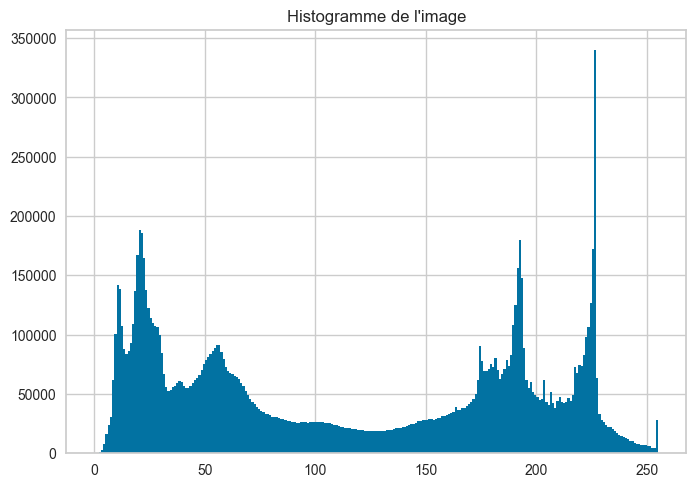

In [16]:
# Affichage de l'histogramme de l'image
plt.hist(teaching_mat.flatten(), bins=range(256))
plt.title("Histogramme de l'image")
plt.show()

La distribution se répartie entre 0 et environ 250 ce qui montre une exposition correcte de l'image. Lorqu'une image est sous-exposée, la distribution est concentrée vers des niveaux faibles de gris donc proche de 0, et inversement pour les images sur-exposés.

Nous allons tout de même effectuer des traitements d'image supplémentaire pour améliorer sa qualité

### 3.3) Contraste de l'image

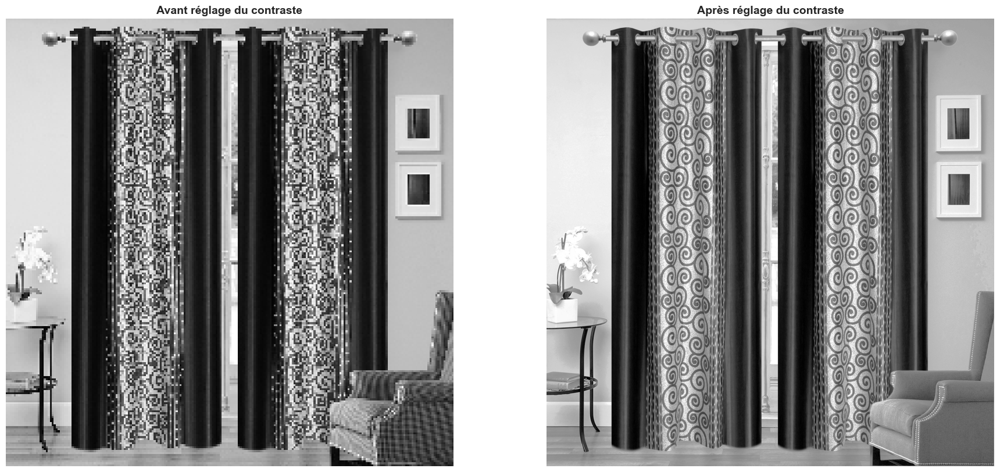

In [17]:
plt.figure(figsize=(22, 10))
plt.subplot(1, 2, 1)  
plt.imshow(teaching_image.resize((largeur, hauteur), Image.NEAREST), cmap='gray')
plt.title("Avant réglage du contraste", fontsize = 14, fontweight = "bold")
plt.axis('off')

# Réglage du contraste de l'image
teaching_image_equalized = ImageOps.equalize(teaching_image, mask=None)

# Affichage des images après filtrage
plt.subplot(1, 2, 2)  
plt.imshow(teaching_image_equalized, cmap='gray')
plt.title("Après réglage du contraste", fontsize=14, fontweight = "bold")
plt.axis('off')
plt.show()

On observe une nette amélioration de l'image après le réglage du contraste

### 3.4) Application de filtre

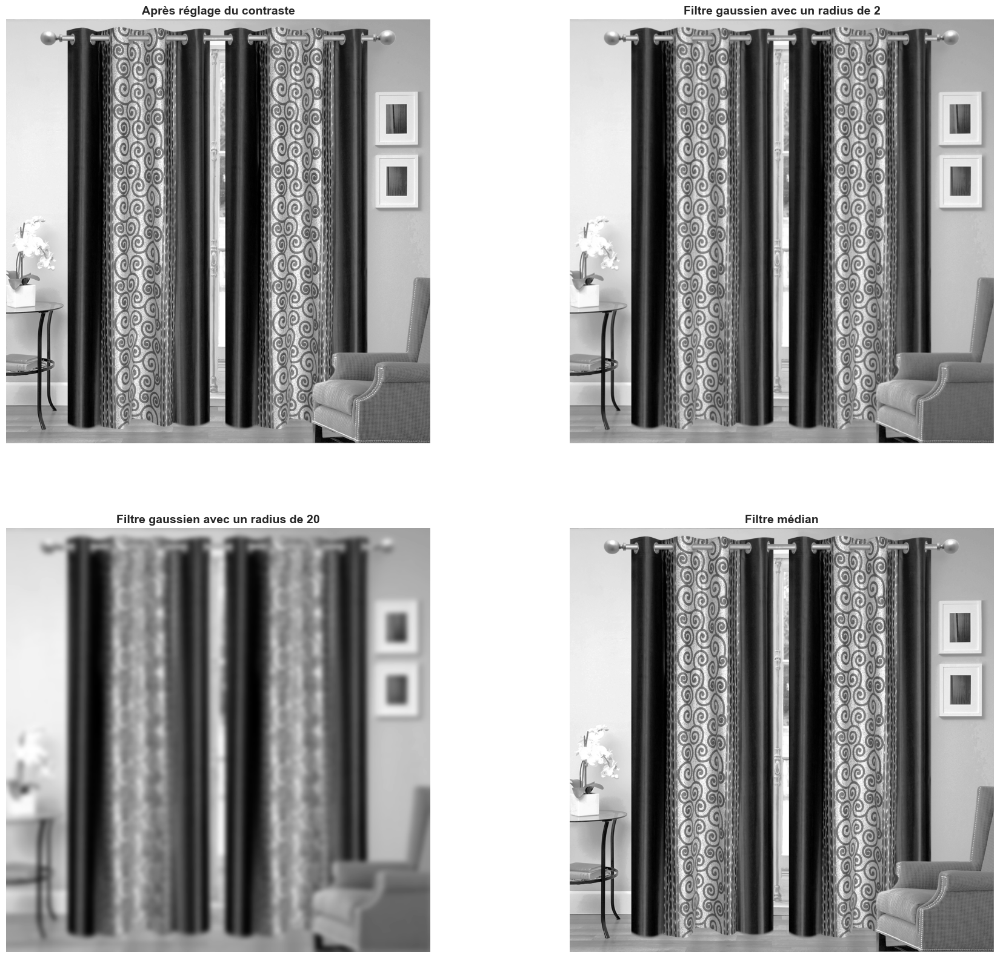

In [18]:
plt.figure(figsize=(22, 20))

# Affichage de l'image après réglage du contraste
plt.subplot(2, 2, 1)  
plt.imshow(teaching_image_equalized, cmap='gray')
plt.title("Après réglage du contraste", fontsize=14, fontweight = "bold")
plt.axis('off')

# Application du gaussien (filtre local s'appuyant sur le voisinage) 
gaussian_filter_2 = teaching_image_equalized.filter(ImageFilter.GaussianBlur(radius=2))
gaussian_filter_20 = teaching_image_equalized.filter(ImageFilter.GaussianBlur(radius=20))

# Application du filtre median
median_filter = teaching_image_equalized.filter(ImageFilter.MedianFilter(size=3))

# Affichage de l'image après un filtre gaussien de radius de 2
plt.subplot(2, 2, 2)  
plt.imshow(gaussian_filter_2, cmap='gray')
plt.title("Filtre gaussien avec un radius de 2", fontsize=14, fontweight = "bold")
plt.axis('off')

# Affichage de l'image après un filtre gaussien de radius de 20
plt.subplot(2, 2, 3)  
plt.imshow(gaussian_filter_20, cmap='gray')
plt.title("Filtre gaussien avec un radius de 20", fontsize=14, fontweight = "bold")
plt.axis('off')

# Affichage de l'image après un filtre médian de taille de 3
plt.subplot(2, 2, 4)  
plt.imshow(median_filter, cmap='gray')
plt.title("Filtre médian", fontsize=14, fontweight = "bold")
plt.axis('off')

plt.show()

L'application des ces différents filtres nous permet de remarquer l'atout de l'application d'un filtre sur la qualité de l'image. Nous poursuivrons avec le filtre median

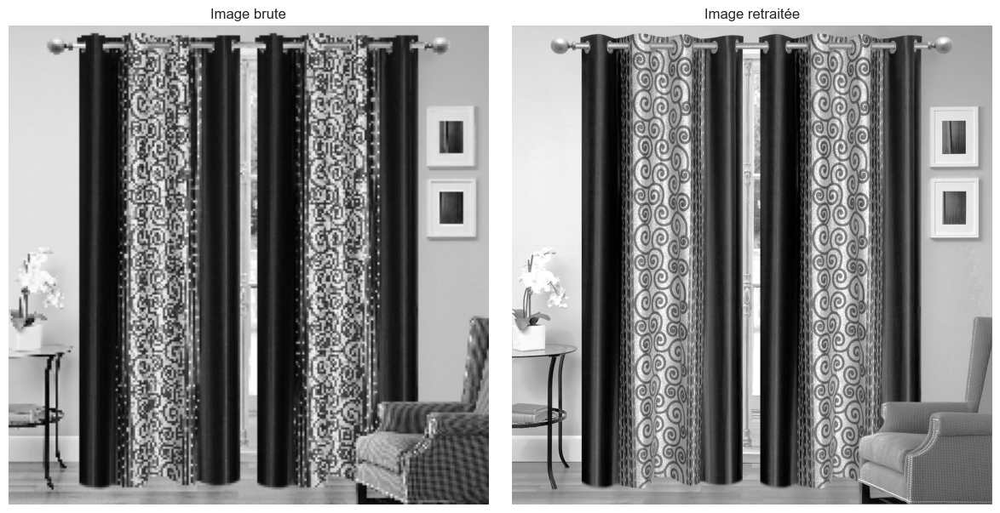

In [19]:
# Affichage de l'image brute et de l'image après traitement
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(teaching_image.resize((largeur, hauteur), Image.NEAREST), cmap='gray')
axes[0].set_title("Image brute")
axes[1].imshow(median_filter, cmap='gray')
axes[1].set_title("Image retraitée")
for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()

## IV- Extraction de features d'image avec SIFT sur l'ensemble du jeu de données

L'algorithme SIFT (Scale-Invariant Feature Transform) est une méthode très populaire dans le domaine de la vision par ordinateur, permettant d'extraire des caractéristiques (ou points d'intérêt) d'une image et de calculer leurs descripteurs.

Un descripteur est un vecteur qui décrit le voisinage de la caractéristique à laquelle il est associé. Il est utilisé pour repérer les paires de caractéristiques qui se ressemblent le plus dans deux images. Pour faciliter cette étape de correspondance, le descripteur doit présenter de nombreuses propriétés d'invariance (rotation, échelle, illumination). Ainsi, les descripteurs de deux caractéristiques identiques à un changement géométrique ou photométrique près doivent être aussi proches que possible. L'étape de correspondance revient alors à comparer les descripteripteurs

### 4.1) Preprocessing

In [20]:
# Création d'une nouvelle variable avec preprocessing des images
df["processed_images"] = df["path_image"].apply(fc.processed_images)

### 4.2) Création des descripteurs

In [21]:
import time

# Création des descripteurs pour toutes les images
sift = cv2.SIFT_create()
temps1=time.time()
sift_keypoints = [] # sauvagarde des descripteurs pour réaliser les histogrammes par image

for index, row in df.iterrows(): 
    
    # Passage de l'image en nuances de gris
    image = cv2.imread(row["processed_images"])
    image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    
    # calcul des descripteurs
    kp, des = sift.detectAndCompute(image, None)
    sift_keypoints.append(des)

# liste de descripteurs pour l'ensemble des images utilisé pour créer les clusters de descripteurs
sift_keypoints_by_img = np.asarray(sift_keypoints, dtype=object)
sift_keypoints_all = np.concatenate(sift_keypoints_by_img, axis=0)

print()
print("Nombre de descripteurs : ", sift_keypoints_all.shape)

duration1=time.time()-temps1
print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")


Nombre de descripteurs :  (10242939, 128)
temps de traitement SIFT descriptor :           857.08 secondes


### 4.3) Création des clusters des descripteurs

In [22]:
from sklearn import cluster, metrics

# Determination du nombre de cluster
temps1=time.time()

k = int(round(np.sqrt(len(sift_keypoints_all)),0))
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, init='k-means++', random_state=42)
kmeans.fit(sift_keypoints_all)

duration1=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  3200
Création de 3200 clusters de descripteurs ...


D:\Programme\lib\site-packages\sklearn\cluster\_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


temps de traitement kmeans :           663.38 secondes


### 4.4) Création des features des images

In [23]:
# Création des histogrammes (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Création de la matrice d'histogrammes
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) # Calcul de l'histogramme
    hist_vectors.append(hist) # histogramme = vecteur feature

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :           454.38 secondes


In [24]:
im_features.shape

(1050, 3200)

### 4.5) Réduction dimensionnelle PCA/t-SNE des features

**PCA**

In [25]:
print("Dimensions du jeu de données avant réduction PCA : ", im_features.shape)
pca = PCA(n_components=0.99)
feat_pca= pca.fit_transform(im_features)
print("Dimensions du jeu de données après réduction PCA : ", feat_pca.shape)

Dimensions du jeu de données avant réduction PCA :  (1050, 3200)
Dimensions du jeu de données après réduction PCA :  (1050, 732)


**T-SNE et affichage des produits selon les vraies catégories**

In [26]:
start_tsne = time.time()

#tsne = TSNE(n_components=2, perplexity=20, n_iter=2000, init='random', random_state=42)
tsne = TSNE(n_components=2, perplexity=25, n_iter=2000, init='random', random_state=42)
# tsne = TSNE(n_components=2, perplexity=30, n_iter=2000, init='random', random_state=42)
#tsne = TSNE(n_components=2, perplexity=35, n_iter=2000, init='random', random_state=42)

X_tsne = tsne.fit_transform(feat_pca)

stop_tsne = time.time() - start_tsne

print("Temps de T-SNE : ", "%15.2f" % stop_tsne, "secondes")

Temps de T-SNE :            11.96 secondes


In [27]:
# Création du dataframe
df_tsne = pd.DataFrame(X_tsne, columns=['tsne1', 'tsne2'])
df_tsne["class"] = df["main_category"]
df_tsne.head()

,tsne1,tsne2,class
0,-15.304422,-9.618711,home furnishing
1,-0.043333,-15.688442,baby care
2,3.039969,-23.682785,baby care
3,-2.970514,-13.457757,home furnishing
4,0.430196,-13.382526,home furnishing


In [28]:
# Réalisation du k-means avec 7 clusters (7 catégories de produits)
kmeans = KMeans(n_clusters=7, init='k-means++', random_state=42)
kmeans.fit_predict(X_tsne)

# Récupération des clusters
kmeans_labels = kmeans.labels_

# Ajout des clusters au dataframe précédent
df_tsne["cluster"] = kmeans_labels

print(df_tsne.head())
print()
ari = adjusted_rand_score(df_tsne['class'],df_tsne['cluster'])
print(f'ARI avec extraction des features avec SIFT : {ari}')

D:\Programme\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


       tsne1      tsne2            class  cluster
0 -15.304422  -9.618711  home furnishing        5
1  -0.043333 -15.688442        baby care        5
2   3.039969 -23.682785        baby care        2
3  -2.970514 -13.457757  home furnishing        5
4   0.430196 -13.382526  home furnishing        5

ARI avec extraction des features avec SIFT : 0.03802694366477375


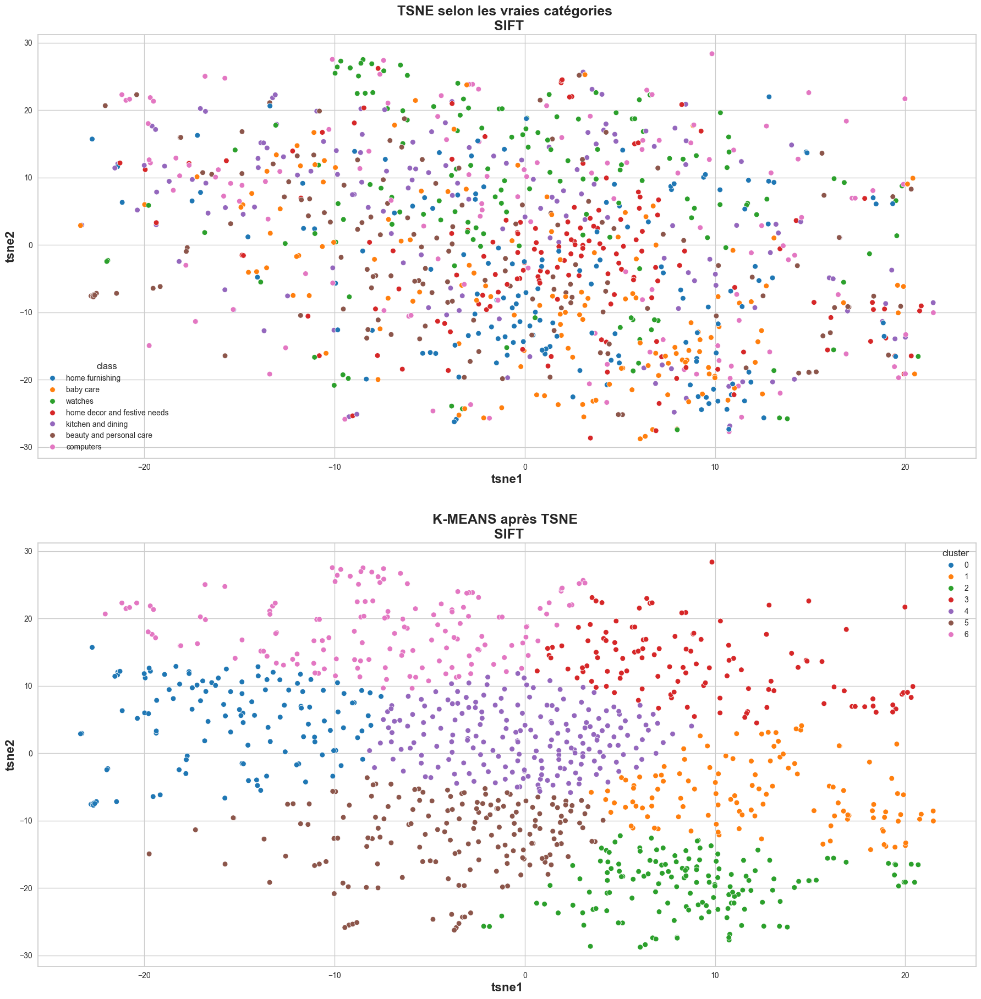

In [29]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(22, 22))
with sns.color_palette(palette="tab10"):
    plt.rcParams.update({"font.size":12})
    sns.scatterplot(ax=axes[0], data= df_tsne, x="tsne1", y="tsne2", hue="class", legend="brief")
    axes[0].set_xlabel("tsne1", fontname= "sans-serif", fontsize = 16, fontweight = "bold")
    axes[0].set_ylabel("tsne2", fontname= "sans-serif", fontsize = 16, fontweight = "bold")
    axes[0].set_title("TSNE selon les vraies catégories \n SIFT", fontname= "sans-serif", fontsize = 18, fontweight = "bold")
    sns.scatterplot(ax=axes[1], data= df_tsne, x="tsne1", y="tsne2", hue="cluster", palette="tab10", legend="brief")
    axes[1].set_xlabel("tsne1", fontname= "sans-serif", fontsize = 16, fontweight = "bold")
    axes[1].set_ylabel("tsne2", fontname= "sans-serif", fontsize = 16, fontweight = "bold")
    axes[1].set_title("K-MEANS après TSNE \n SIFT", fontname= "sans-serif", fontsize = 18, fontweight = "bold")
plt.show()

La classification des images selon leur catégorie via SIFT donne des résultats très mauvais, que ce soit au niveau visuel ou au niveau du score ARI (0.038). Nous allons donc essayer un autre modèle, le CNN Transfer Learning.

## V- CNN Transfer Learning

Le CNN Transfer Learning est une technique de deep learning où un modèle pré-entraîné sur une grande quantité de données est utilisé comme point de départ pour résoudre une tâche similaire ou différente. 

Plutôt que de construire et d'entraîner un modèle à partir de zéro, ce qui peut nécessiter beaucoup de données et de temps de calcul, on utilise un modèle déjà entraîné sur une tâc similaireée. Ensuite, on adapte ce modèle aux nouvelles données ou à la nouvelle tâche en réglant ses poids, souvent uniquement sur les dernières couches, tout en conservant les poids appris dans les couches précédentes. Cela permet d'exploiter les connaissances apprises par le modèle pré-entraîné, ce qui peut améliorer considérablement les performances du modèle sur la nouvelle tâche, même avec moins de données d'entraînemenant.

### 5.1) Création du modèle pré-entrainé

In [30]:
base_model = VGG16()
model = Model(inputs=base_model.inputs, outputs=base_model.layers[-2].output)

print(model.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

### 5.2) Création des features des images

In [31]:
images_features = []
i=0 
for image_file in df["path_image"] :
    if i%100 == 0 : print(i)
    i +=1
    image = load_img(image_file, target_size=(224, 224))
    image = img_to_array(image) 
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    images_features.append(model.predict(image, verbose=0)[0]) # predict from pretrained model

images_features = np.asarray(images_features)
images_features.shape

0
100
200
300
400
500
600
700
800
900
1000


(1050, 4096)

### 5.3) Réduction dimension et analyse

### 5.3.1) Réduction de dimension PCA

In [32]:
print("Dimensions du jeu de données avant réduction PCA : ", images_features.shape)
pca_vgg16 = PCA(n_components=0.99)
feat_pca_vgg16 = pca.fit_transform(images_features)
print("Dimensions du jeu de données après réduction PCA : ", feat_pca_vgg16.shape)

Dimensions du jeu de données avant réduction PCA :  (1050, 4096)
Dimensions du jeu de données après réduction PCA :  (1050, 803)


### 5.3.2) Réduction de dimension T-SNE et affichage des images selon vraies classes

In [33]:
# T-SNE

start_tsne_vgg16 = time.time()

tsne_vgg16 = TSNE(n_components=2, perplexity=30, n_iter=2000, init='random', random_state=42)
#tsne_vgg16 = TSNE(n_components=2, perplexity=35, n_iter=2000, init='random', random_state=42)
#tsne_vgg16 = TSNE(n_components=2, perplexity=25, n_iter=2000, init='random', random_state=42)
#tsne_vgg16 = TSNE(n_components=2, perplexity=20, n_iter=2000, init='random', random_state=42)

X_tsne_vgg16 = tsne_vgg16.fit_transform(feat_pca_vgg16)

stop_tsne_vgg16 = time.time() - start_tsne_vgg16

print("Temps de T-SNE : ", "%15.2f" % stop_tsne_vgg16, "secondes")

Temps de T-SNE :            11.26 secondes


In [34]:
# Création du dataframe
df_tsne_vgg16 = pd.DataFrame(X_tsne_vgg16, columns=['tsne1', 'tsne2'])
df_tsne_vgg16["class"] = df["main_category"]
df_tsne_vgg16.head()

,tsne1,tsne2,class
0,3.913067,-32.926765,home furnishing
1,-11.137315,-15.053416,baby care
2,-15.986542,-15.679616,baby care
3,-3.325282,-36.619663,home furnishing
4,-1.262194,-36.220913,home furnishing


In [35]:
# Réalisation du k-means avec 7 clusters (7 catégories de produits)
kmeans_vgg16 = KMeans(n_clusters=7, init='k-means++', random_state=42)
kmeans_vgg16.fit_predict(X_tsne_vgg16)

# Récupération des clusters
kmeans_vgg16_labels = kmeans_vgg16.labels_

# Ajout des clusters au dataframe précédent
df_tsne_vgg16["cluster"] = kmeans_vgg16_labels

print(df_tsne_vgg16.head())
print()
ari_vgg16 = adjusted_rand_score(df_tsne_vgg16['class'],df_tsne_vgg16['cluster'])
print(f'ARI avec extraction des features via Transfer Learning : {ari_vgg16}')

D:\Programme\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


       tsne1      tsne2            class  cluster
0   3.913067 -32.926765  home furnishing        4
1 -11.137315 -15.053416        baby care        1
2 -15.986542 -15.679616        baby care        1
3  -3.325282 -36.619663  home furnishing        4
4  -1.262194 -36.220913  home furnishing        4

ARI avec extraction des features via Transfer Learning : 0.44645700489326784


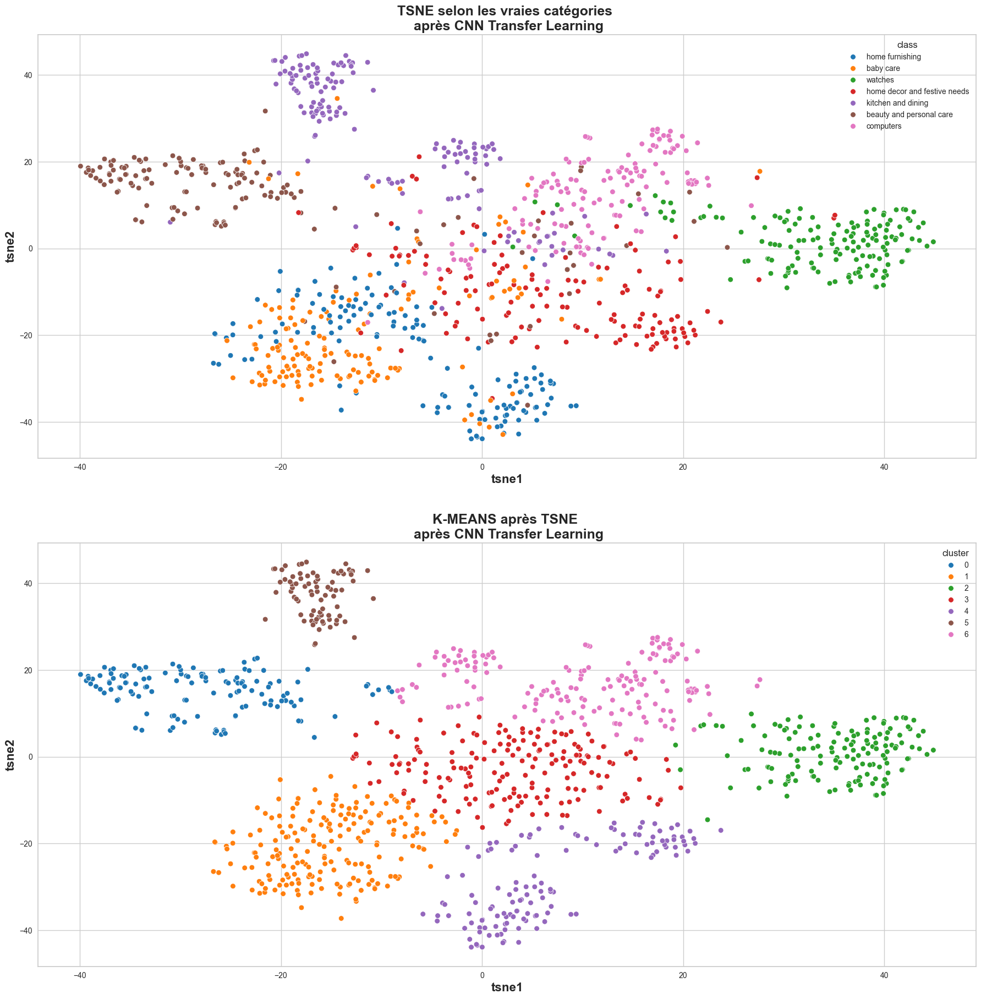

In [36]:
# Visualisation des clusters
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(22, 22))
with sns.color_palette(palette="tab10"):
    plt.rcParams.update({"font.size":12})
    sns.scatterplot(ax=axes[0], data= df_tsne_vgg16, x="tsne1", y="tsne2", hue="class", legend="brief")
    axes[0].set_xlabel("tsne1", fontname= "sans-serif", fontsize = 16, fontweight = "bold")
    axes[0].set_ylabel("tsne2", fontname= "sans-serif", fontsize = 16, fontweight = "bold")
    axes[0].set_title("TSNE selon les vraies catégories \n après CNN Transfer Learning", fontname= "sans-serif", fontsize = 18, fontweight = "bold")
    sns.scatterplot(ax=axes[1], data= df_tsne_vgg16, x="tsne1", y="tsne2", hue="cluster", palette="tab10", legend="brief")
    axes[1].set_xlabel("tsne1", fontname= "sans-serif", fontsize = 16, fontweight = "bold")
    axes[1].set_ylabel("tsne2", fontname= "sans-serif", fontsize = 16, fontweight = "bold")
    axes[1].set_title("K-MEANS après TSNE \n après CNN Transfer Learning", fontname= "sans-serif", fontsize = 18, fontweight = "bold")
plt.show()

Le modèle CNN Transfer Learning est beaucoup plus performant que SIFT, que ce soit au niveau du score ARI (0.45) ou au niveau visuel.

### CONCLUSION 

* L'analyse graphique montre visuellement qu'il est réalisable de séparer automatiquement les images selon leurs vraies classes
* Ceci suffit à démontrer la faisabilité de réaliser ultérieurement une classification supervisée pour déterminer automatiquement les classes des images
* Cette étape 1 est très rapide à mettre en oeuvre. Une conclusion négative sur la faisabilité aurait éviter de réaliser des traitements beaucoup plus lourd de classification supervisée
* Cette démarche en 2 étapes (1. Faisabilité, 2. Classification supervisée si étape 1 OK) s'inscrit dans une démarche agile de tout projet Data


In [37]:
# Sauvegarde du fichier df cleané avec les chemins d'accès
df.to_csv("path_image_cleaned.csv", index = False)